# Importing Libraries

In [1]:
import pandas as pd
pd.options.display.float_format = '{:,.2f}'.format
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from wordcloud import WordCloud, STOPWORDS

colors = ["#89CFF0", "#FF69B4", "#FFD700", "#7B68EE", "#FF4500",
          "#9370DB", "#32CD32", "#8A2BE2", "#FF6347", "#20B2AA",
          "#FF69B4", "#00CED1", "#FF7F50", "#7FFF00", "#DA70D6"]

# Data Importing

In [2]:
data = pd.read_csv("kindle_data-v2.csv")
data.head()

,asin,title,author,soldBy,imgUrl,productURL,stars,reviews,price,isKindleUnlimited,category_id,isBestSeller,isEditorsPick,isGoodReadsChoice,publishedDate,category_name
0,B00TZE87S4,Adult Children of Emotionally Immature Parents...,Lindsay C. Gibson,Amazon.com Services LLC,https://m.media-amazon.com/images/I/713KZTsaYp...,https://www.amazon.com/dp/B00TZE87S4,4.80,0,9.99,False,6,True,False,False,2015-06-01,Parenting & Relationships
1,B08WCKY8MB,"From Strength to Strength: Finding Success, Ha...",Arthur C. Brooks,Penguin Group (USA) LLC,https://m.media-amazon.com/images/I/A1LZcJFs9E...,https://www.amazon.com/dp/B08WCKY8MB,4.40,0,16.99,False,6,False,False,False,2022-02-15,Parenting & Relationships
2,B09KPS84CJ,Good Inside: A Guide to Becoming the Parent Yo...,Becky Kennedy,HarperCollins Publishers,https://m.media-amazon.com/images/I/71RIWM0sv6...,https://www.amazon.com/dp/B09KPS84CJ,4.80,0,16.99,False,6,False,True,False,2022-09-13,Parenting & Relationships
3,B07S7QPG6J,Everything I Know About Love: A Memoir,Dolly Alderton,HarperCollins Publishers,https://m.media-amazon.com/images/I/71QdQpTiKZ...,https://www.amazon.com/dp/B07S7QPG6J,4.20,0,9.95,True,6,False,True,False,2020-02-25,Parenting & Relationships
4,B00N6PEQV0,The Seven Principles for Making Marriage Work:...,John Gottman,Random House LLC,https://m.media-amazon.com/images/I/813o4WOs+w...,https://www.amazon.com/dp/B00N6PEQV0,4.70,0,13.99,False,6,False,False,False,2015-05-05,Parenting & Relationships


# Data Checking

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 133102 entries, 0 to 133101
Data columns (total 16 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   asin               133102 non-null  object 
 1   title              133102 non-null  object 
 2   author             132677 non-null  object 
 3   soldBy             123869 non-null  object 
 4   imgUrl             133102 non-null  object 
 5   productURL         133102 non-null  object 
 6   stars              133102 non-null  float64
 7   reviews            133102 non-null  int64  
 8   price              133102 non-null  float64
 9   isKindleUnlimited  133102 non-null  bool   
 10  category_id        133102 non-null  int64  
 11  isBestSeller       133102 non-null  bool   
 12  isEditorsPick      133102 non-null  bool   
 13  isGoodReadsChoice  133102 non-null  bool   
 14  publishedDate      84086 non-null   object 
 15  category_name      133102 non-null  object 
dtypes:

In [4]:
data['publishedDate'] = pd.to_datetime(data['publishedDate'])

In [5]:
data.isnull().sum()

asin                     0
title                    0
author                 425
soldBy                9233
imgUrl                   0
productURL               0
stars                    0
reviews                  0
price                    0
isKindleUnlimited        0
category_id              0
isBestSeller             0
isEditorsPick            0
isGoodReadsChoice        0
publishedDate        49016
category_name            0
dtype: int64

In [6]:
data.shape

(133102, 16)

In [7]:
data.dropna(axis=0,inplace = True)

In [8]:
data.shape

(77800, 16)

# Data Cleaning

In [9]:
def remove_bad_char(column_name):
    return column_name.replace("("," ").replace(")"," ").replace("|"," ").replace("."," ").replace(","," ").lower().strip()
    

### Removing Bad Characters

In [10]:
data['author'] = data['author'].apply(remove_bad_char)
data['author']

0         lindsay c  gibson
1          arthur c  brooks
2             becky kennedy
3            dolly alderton
4              john gottman
                ...        
133097          leo tolstoy
133098            mo gawdat
133099      alexandre dumas
133100          leo tolstoy
133101          jane austen
Name: author, Length: 77800, dtype: object

In [11]:
data['title'] = data['title'].apply(remove_bad_char)
data['title']

0         adult children of emotionally immature parents...
1         from strength to strength: finding success  ha...
2         good inside: a guide to becoming the parent yo...
3                    everything i know about love: a memoir
4         the seven principles for making marriage work:...
                                ...                        
133097                                        anna karenina
133098    scary smart: scary smart: the future of artifi...
133099    the count of monte cristo: the original unabri...
133100                                        war and peace
133101                                  pride and prejudice
Name: title, Length: 77800, dtype: object

In [12]:
data['soldBy'] = data['soldBy'].apply(remove_bad_char)
data['soldBy']

0          amazon com services llc
1          penguin group  usa  llc
2         harpercollins publishers
3         harpercollins publishers
4                 random house llc
                    ...           
133097                   de marque
133098     amazon com services llc
133099                   de marque
133100                   de marque
133101                   de marque
Name: soldBy, Length: 77800, dtype: object

In [13]:
data['category_name'] = data['category_name'].apply(remove_bad_char)
data['category_name']

0         parenting & relationships
1         parenting & relationships
2         parenting & relationships
3         parenting & relationships
4         parenting & relationships
                    ...            
133097                   nonfiction
133098                   nonfiction
133099                   nonfiction
133100                   nonfiction
133101                   nonfiction
Name: category_name, Length: 77800, dtype: object

# EDA

In [14]:
data.columns

Index(['asin', 'title', 'author', 'soldBy', 'imgUrl', 'productURL', 'stars',
       'reviews', 'price', 'isKindleUnlimited', 'category_id', 'isBestSeller',
       'isEditorsPick', 'isGoodReadsChoice', 'publishedDate', 'category_name'],
      dtype='object')

#### Filtering relevent columns

In [15]:
df = data[["title","author","soldBy","stars","reviews","isKindleUnlimited","isBestSeller","isGoodReadsChoice","publishedDate","category_name"]]

In [16]:
df.head()

,title,author,soldBy,stars,reviews,isKindleUnlimited,isBestSeller,isGoodReadsChoice,publishedDate,category_name
0,adult children of emotionally immature parents...,lindsay c gibson,amazon com services llc,4.80,0,False,True,False,2015-06-01,parenting & relationships
1,from strength to strength: finding success ha...,arthur c brooks,penguin group usa llc,4.40,0,False,False,False,2022-02-15,parenting & relationships
2,good inside: a guide to becoming the parent yo...,becky kennedy,harpercollins publishers,4.80,0,False,False,False,2022-09-13,parenting & relationships
3,everything i know about love: a memoir,dolly alderton,harpercollins publishers,4.20,0,True,False,False,2020-02-25,parenting & relationships
4,the seven principles for making marriage work:...,john gottman,random house llc,4.70,0,False,False,False,2015-05-05,parenting & relationships


# Most Selling Book

In [17]:
books = df["title"].value_counts()
books = books[books > 2]
books

organic chemistry                                                              7
macroeconomics                                                                 6
social psychology                                                              5
criminal evidence                                                              5
college algebra                                                                5
the richest man in babylon                                                     4
abnormal psychology                                                            4
psychology                                                                     4
financial accounting                                                           4
introduction to law                                                            4
chemistry                                                                      4
meditations                                                                    4
as a man thinketh           

In [18]:
most_sold = books.idxmax()
most_sold

'organic chemistry'

# Most Selling Author

In [19]:
author = df['author'].value_counts()
author = author[author>20]
author

dk eyewitness                154
fodor's travel guides        111
dk                            96
america's test kitchen        73
amazon com services llc       68
rough guides                  67
stephen king                  56
nora roberts                  49
rick steves                   43
max lucado                    38
cathy glass                   33
joyce meyer                   31
sparknotes                    28
john grisham                  28
taste of home                 28
stephen mettling              27
james patterson               27
thomas nelson                 26
thich nhat hanh               26
mometrix                      26
danielle steel                26
kaplan test prep              24
meghan quinn                  24
zondervan                     24
statpearls publishing llc     24
john c  maxwell               24
lingo mastery                 24
mark twain                    23
culture smart!                23
brian tracy                   23
the prince

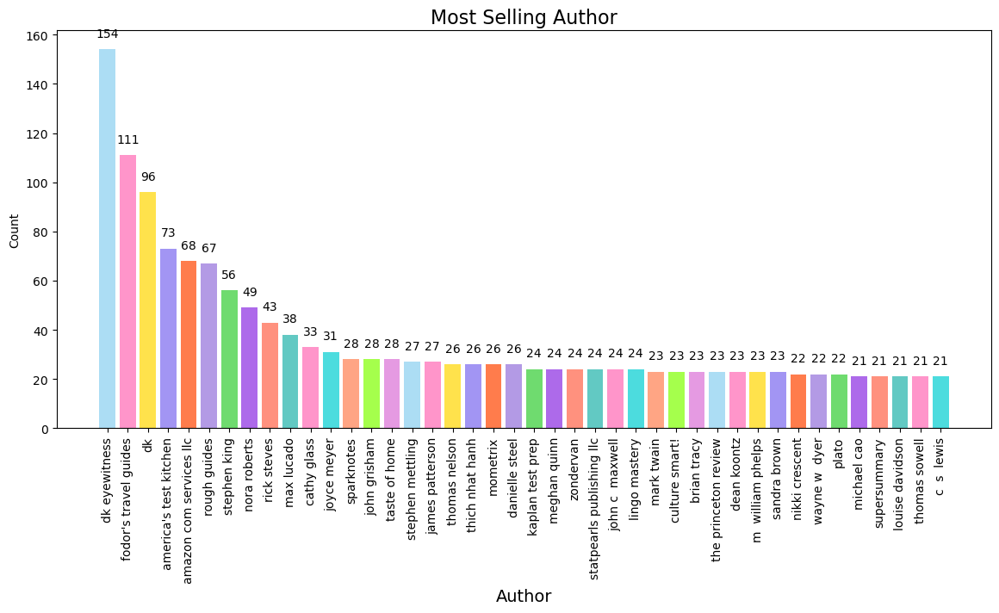

In [20]:
plt.figure(figsize=(14,6))

plt.bar(author.index,author.values,color=colors,alpha=0.7)
plt.xticks(rotation=90)
plt.title("Most Selling Author",fontsize=16)
plt.xlabel("Author",fontsize=14)
plt.ylabel("Count")

for author, count in zip(author.index,author.values):
    plt.text(author, count+5, str(count),ha='center', fontsize=10)

plt.show()

#### dk eyewitness is top most Author

# Top Seller

In [21]:
soldBy = df['soldBy'].value_counts()
soldBy = soldBy[soldBy>100]
soldBy

amazon com services llc                    48963
random house llc                            4763
hachette book group                         3627
penguin group  usa  llc                     3225
harpercollins publishers                    3136
simon and schuster digital sales inc        2320
macmillan                                   2242
john wiley and sons inc                     2182
penguin random house publisher services     1870
simon & schuster digital sales inc          1580
pearson education inc                       1099
harpercollins publishing                     895
cengage learning                             678
prh uk                                       324
harlequin digital sales corp                 201
macmillan higher education                   198
de marque                                    180
w  w  norton & company                       116
Name: soldBy, dtype: int64

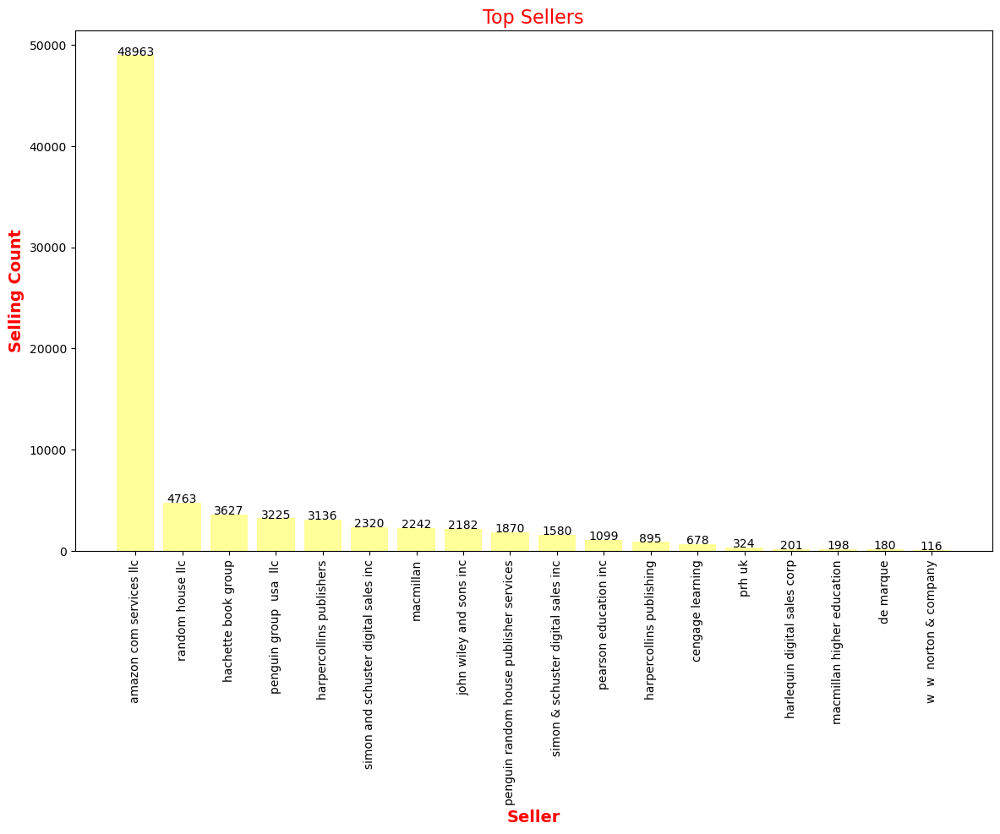

In [22]:
plt.figure(figsize=(14,8))


plt.bar(soldBy.index,soldBy.values,color='yellow',alpha=0.4)
plt.title("Top Sellers",fontsize=16,color='red')
plt.xlabel("Seller",fontsize=14,fontweight='bold',color='red')
plt.ylabel("Selling Count",fontsize=14,fontweight='bold',color='red')
plt.xticks(rotation=90)
for soldBy, count in zip(soldBy.index,soldBy.values):
    plt.text(soldBy,count+5,str(count),ha='center')
    
   
plt.show()

#### amazon com services llc is top books seller

# Best Seller Count

In [23]:
BestSeller = df['isBestSeller'].value_counts()
BestSeller

False    76538
True      1262
Name: isBestSeller, dtype: int64

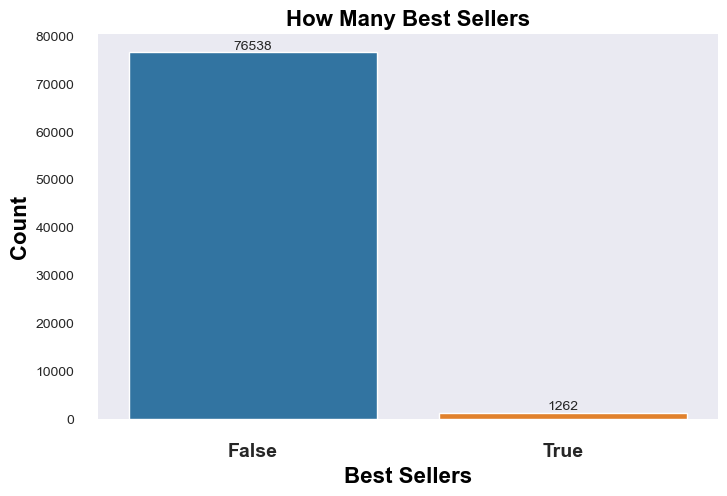

In [24]:
plt.figure(figsize=(8,5))
sns.set_style('dark')
ax = sns.countplot(data = df, x = 'isBestSeller')
sns.despine()
sns.despine(offset=10,trim =True )
sns.set_palette("bright")
plt.title("How Many Best Sellers",weight='bold',fontsize=16,color="black")
plt.xlabel("Best Sellers",weight='bold',fontsize=16,color="black")
plt.ylabel("Count",weight='bold',fontsize=16,color="black")
plt.xticks(fontsize=14,fontweight='bold')

for i in ax.containers:
    ax.bar_label(i,)
plt.show()

# Good Reads Choice

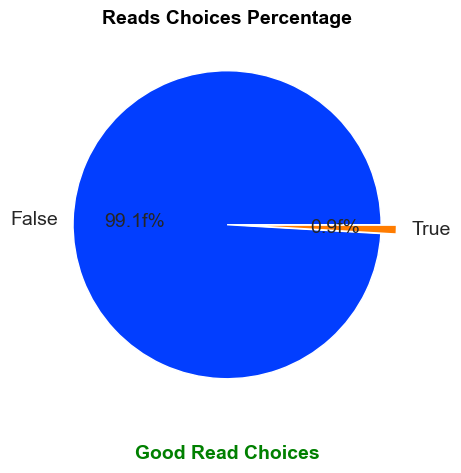

In [25]:
plt.figure(figsize = (10,5))
explode =(0,0.1)
count = df['isGoodReadsChoice'].value_counts()
count.plot(kind='pie',autopct='%1.1ff%%',explode = explode,fontsize=14)
plt.xlabel('Good Read Choices',weight = 'bold',color = 'green',labelpad = 20,fontsize=14)
plt.title('Reads Choices Percentage',weight = 'bold',color = 'black',fontsize=14)
plt.ylabel(" ")
plt.show()

#### 0.91% readers choice is Good

# Top Books Published Years

In [26]:
year = df['publishedDate'].dt.year.value_counts().sort_index(ascending = False)
year = year[year>100]
year

2023    13606
2022     9939
2021     7644
2020     6891
2019     5599
2018     4879
2017     3922
2016     3483
2015     3059
2014     3032
2013     2918
2012     2559
2011     2342
2010     1703
2009     1740
2008      956
2007      793
2006      472
2005      371
2004      322
2003      291
2002      242
2001      202
2000      140
1999      117
Name: publishedDate, dtype: int64

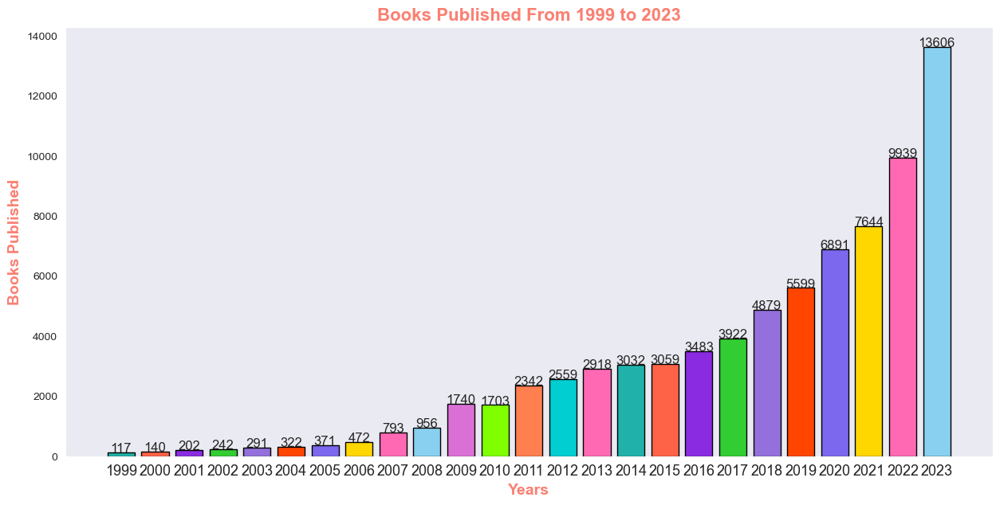

In [27]:
plt.figure(figsize=(15,7))
plt.bar(year.index,year.values,color = colors ,edgecolor='black')
plt.title("Books Published From 1999 to 2023",fontsize=16,color='salmon',fontweight='bold')
plt.xlabel("Years",fontsize=14,color='salmon',fontweight='bold')
plt.ylabel("Books Published",fontsize=14,color='salmon',fontweight='bold')
plt.xticks(range(1999,2024,1),fontsize=13)

for year,count in zip(year.index,year.values):
    plt.text(year,count + 15, str(count),ha='center',fontsize = 12)
plt.show()

#### Maximum Books published in 2023

# Top categories

In [28]:
df['category_name'].unique()

array(['parenting & relationships', 'engineering & transportation',
       'science & math', 'mystery  thriller & suspense',
       'crafts  hobbies & home', 'literature & fiction',
       'biographies & memoirs', 'computers & technology',
       'politics & social sciences', 'teen & young adult',
       'foreign language', 'science fiction & fantasy', 'travel',
       'lgbtq+ ebooks', 'religion & spirituality', 'arts & photo graphy',
       'comics', 'education & teaching', 'history',
       'cookbooks  food & wine', 'nonfiction', 'self-help', 'romance',
       'humor & entertainment', 'reference', 'health  fitness & dieting',
       'sports & outdoors', 'medical', 'business & money', 'law'],
      dtype=object)

In [29]:
category = df['category_name'].value_counts()
category = category[category>300]
category

science & math                  5047
engineering & transportation    4860
biographies & memoirs           4796
parenting & relationships       4441
cookbooks  food & wine          4438
computers & technology          4412
crafts  hobbies & home          4278
travel                          4028
law                             3991
education & teaching            3877
arts & photo graphy             3699
politics & social sciences      3529
self-help                       2996
religion & spirituality         2812
sports & outdoors               2460
reference                       2356
business & money                2284
medical                         2215
humor & entertainment           1771
mystery  thriller & suspense    1425
history                         1415
literature & fiction            1399
lgbtq+ ebooks                   1342
health  fitness & dieting       1313
teen & young adult              1100
nonfiction                       713
science fiction & fantasy        411
r

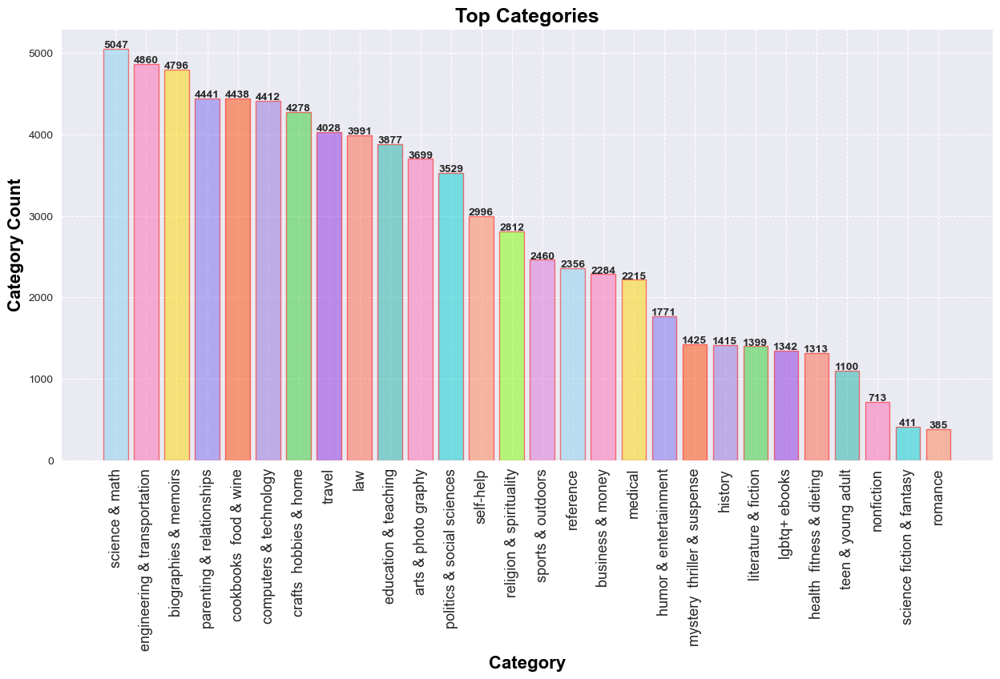

In [30]:
plt.figure(figsize=(15,7))
plt.bar(category.index,category.values,color = colors,edgecolor='red',alpha=0.5)
plt.title('Top Categories',color='black',fontsize=18,weight='bold')
plt.xlabel('Category',color='black',fontsize=16,fontweight='bold')
plt.ylabel("Category Count",color='black',fontsize=16,fontweight='bold')
plt.xticks(rotation=90,fontsize=13)
plt.grid(linestyle='--')
for category,count in zip(category.index,category.values):
    plt.text(category,count + 15, str(count) , ha='center',fontweight='bold')
plt.show()    

#### science & math is top most category people purchased

# Top Star Sellers

In [31]:
reviews = round(df.groupby('soldBy')['stars'].mean(),1).sort_index(ascending=False)
reviews

soldBy
yen press llc                             4.80
w  w  norton & company                    4.10
simon and schuster digital sales inc      4.50
simon & schuster digital sales inc        4.50
scholastic trade publisher                4.50
rh au                                     4.30
random house za                           4.50
random house nz                           4.40
random house llc                          4.50
random house india                        3.70
prh uk                                    4.50
pottermore                                4.60
penguin random house publisher services   4.50
penguin random house australia pty ltd    4.00
penguin group  usa  llc                   4.50
pearson education inc                     4.30
marvel entertainment us                   4.20
macmillan higher education                3.90
macmillan                                 4.50
john wiley and sons inc                   4.40
immat&eacute;riel fr                      4.40
harper

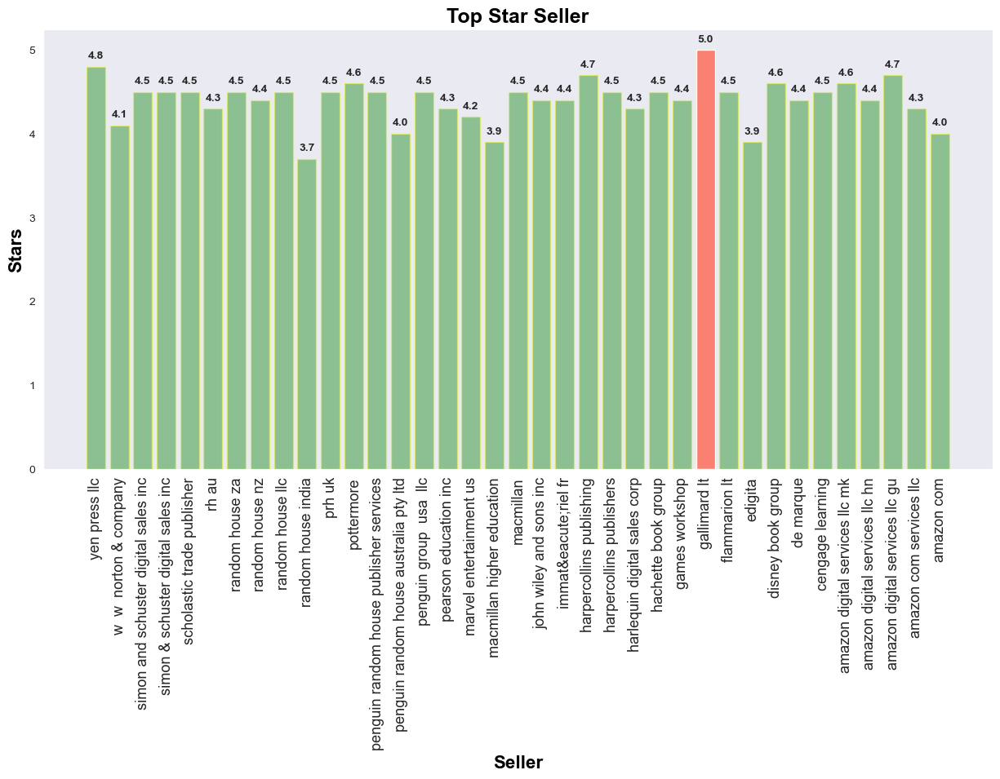

In [32]:
plt.figure(figsize=(15,7))
plt.bar(reviews.index,reviews.values,color = 'green',edgecolor='yellow',alpha=0.4)
plt.title('Top Star Seller',color='black',fontsize=18,weight='bold')
plt.xlabel('Seller',color='black',fontsize=16,fontweight='bold')
plt.ylabel("Stars",color='black',fontsize=16,fontweight='bold')
plt.xticks(rotation=90,fontsize=13)

for soldBy,count in zip(reviews.index,reviews.values):
    plt.text(soldBy,count +0.1, str(count) , ha='center',fontweight='bold')
    
highest = reviews.idxmax()    
plt.bar(highest,reviews[highest],color='salmon')    
plt.show()

#### yen press llc stands out with a highest 5 stars rating

# Top Reviews Authors

In [33]:
reviews = df[df['reviews']>10000].sort_index(ascending = False).dropna()
reviews

,title,author,soldBy,stars,reviews,isKindleUnlimited,isBestSeller,isGoodReadsChoice,publishedDate,category_name
98037,free your mind,m p neary,amazon com services llc,4.10,13498,False,False,False,2015-04-23,self-help
97237,life’s amazing secrets: how to find balance an...,gaur gopal das,random house india,4.60,22019,False,False,False,2018-10-08,self-help
96397,autobiography of a yogi: the original 1946 edi...,paramhansa yogananda,amazon com services llc,4.60,10030,False,False,False,2023-01-10,self-help
96165,as a man thinketh,james allen,amazon com services llc,4.60,17305,False,False,False,2018-10-17,self-help
96001,as a man thinketh,james allen,amazon com services llc,4.60,11563,False,False,False,2019-02-07,self-help
...,...,...,...,...,...,...,...,...,...,...
28608,hello beautiful oprah's book club : a novel,ann napolitano,random house llc,4.40,44048,False,False,False,2023-03-14,literature & fiction
28603,demon copperhead: a pulitzer prize winner,barbara kingsolver,harpercollins publishers,4.60,69379,False,False,False,2022-10-18,literature & fiction
28602,lessons in chemistry: a novel,bonnie garmus,random house llc,4.60,219990,False,False,False,2022-04-05,literature & fiction
28601,tom lake: a reese's book club pick,ann patchett,harpercollins publishers,4.40,10325,False,False,False,2023-08-01,literature & fiction


In [34]:
author_reviews = reviews.groupby('author')['reviews'].mean().sort_index(level="number")
author_reviews = author_reviews.head(10)

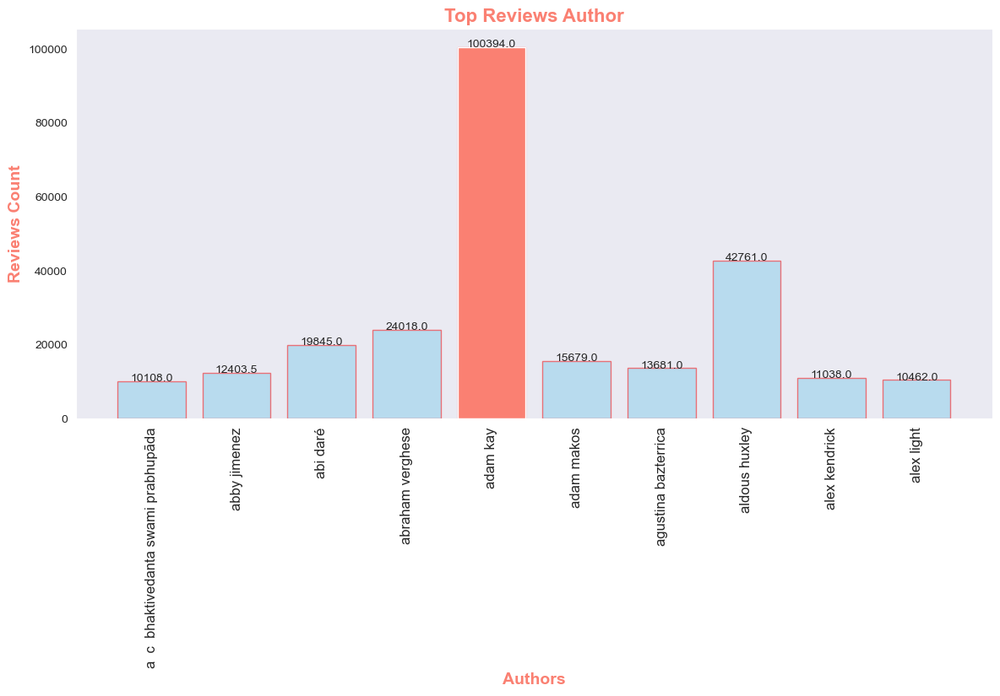

In [35]:
plt.figure(figsize=(14,6))
plt.bar(author_reviews.index,author_reviews.values,color = 'skyblue',alpha=0.5,edgecolor='red')
plt.title("Top Reviews Author",fontsize=16,fontweight='bold',color='salmon')
plt.xlabel("Authors",fontsize=14,fontweight='bold',color='salmon')
plt.ylabel("Reviews Count",fontsize=14,fontweight='bold',color='salmon')
plt.xticks(rotation=90,fontsize=12)

highest = author_reviews.idxmax()
plt.bar(highest,author_reviews[highest],color='salmon')

for author_reviews, count in zip(author_reviews.index,author_reviews.values):
    plt.text(author_reviews,count + 3, str(count), ha = 'center')
    
plt.show()

#### Adam Kay have the maximum reviews among all authors

# Most Frequently Words Used

In [36]:
tag = df['title'] + df['author'] + df['soldBy'] + df['category_name']
tag.head()

0    adult children of emotionally immature parents...
1    from strength to strength: finding success  ha...
2    good inside: a guide to becoming the parent yo...
3    everything i know about love: a memoirdolly al...
4    the seven principles for making marriage work:...
dtype: object

In [37]:
tags = tag.str.replace(":"," ")

In [38]:
tags

0         adult children of emotionally immature parents...
1         from strength to strength  finding success  ha...
2         good inside  a guide to becoming the parent yo...
3         everything i know about love  a memoirdolly al...
4         the seven principles for making marriage work ...
                                ...                        
133097          anna kareninaleo tolstoyde marquenonfiction
133098    scary smart  scary smart  the future of artifi...
133099    the count of monte cristo  the original unabri...
133100          war and peaceleo tolstoyde marquenonfiction
133101    pride and prejudicejane austende marquenonfiction
Length: 77800, dtype: object

In [39]:
tag_words = " ".join(tags)
tag_words

'adult children of emotionally immature parents  how to heal from distant  rejecting  or self-involved parentslindsay c  gibsonamazon com services llcparenting & relationships from strength to strength  finding success  happiness  and deep purpose in the second half of lifearthur c  brookspenguin group  usa  llcparenting & relationships good inside  a guide to becoming the parent you want to bebecky kennedyharpercollins publishersparenting & relationships everything i know about love  a memoirdolly aldertonharpercollins publishersparenting & relationships the seven principles for making marriage work  a practical guide from the country\'s foremost relationship expertjohn gottmanrandom house llcparenting & relationships the glass castle  a memoirjeannette wallssimon and schuster digital sales incparenting & relationships never enough  when achievement culture becomes toxic-and what we can do about itjennifer breheny wallacepenguin group  usa  llcparenting & relationships unmasking autis

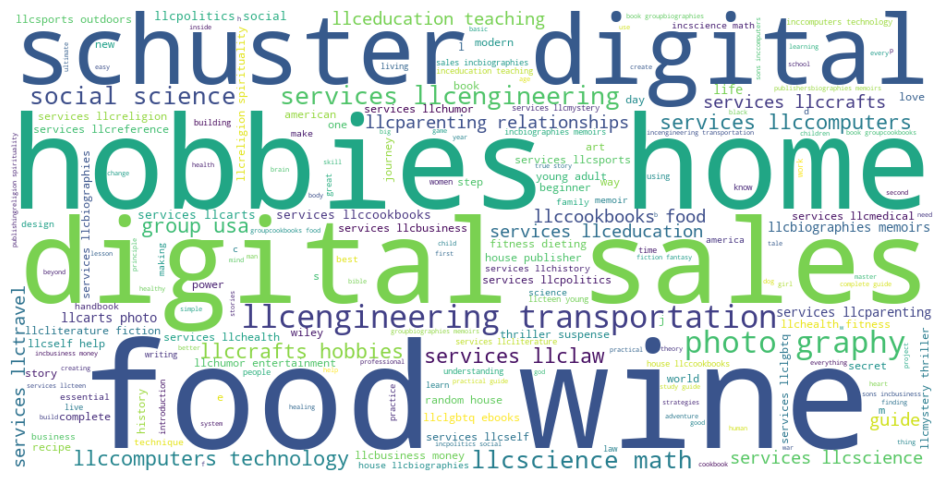

In [40]:
wordcloud = WordCloud(width=1000,height=500,background_color='white').generate(tag_words)
plt.figure(figsize=(15,6))
plt.imshow(wordcloud,interpolation='bilinear')
plt.axis('off')
plt.show()